In [1]:
import gc
import torch

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

In [2]:
import subprocess
subprocess.run(["git", "clone", "https://github.com/sienkozuzanna/generative-models"], check=True)

import sys
sys.path.append("generative-models")
print("Repo cloned successfully")

Cloning into 'generative-models'...


Repo cloned successfully


In [3]:
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import copy

import torch
import torch.optim as optim

from src.data.dataset import get_dataloader, denormalize
from src.models.vae import VAE, vae_loss
from src.evaluation.metrics import evaluate_model
from src.training.utils import set_seed, save_results
from src.visualisations.plots import (
    plot_loss_curves_multiseed,
    plot_image_grid,
    print_summary_table,
    plot_hyperparam_comparison,
)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Device: cuda
GPU: Tesla T4


## Latent dimension VAE

In [4]:
CONFIG = {
    # data
    "data_dir": "/kaggle/input/datasets/norenc100/cats-preprocessed/cats_64",
    "image_size": 64,
    "batch_size": 64,

    # model
    # "latent_dim": 128,
    "base_channels": 32,

    # training
    "epochs": 50,
    "lr": 1e-3,
    "beta": 1.0,
    "seeds": [42, 123, 456],

    # saving
    "checkpoint_dir" : "/kaggle/working/vae_outputs",
    "sample_interval": 10,

    # evaluation
    "n_eval_samples": 1000,
}

Path(CONFIG["checkpoint_dir"]).mkdir(parents=True, exist_ok=True)
print(CONFIG)

{'data_dir': '/kaggle/input/datasets/norenc100/cats-preprocessed/cats_64', 'image_size': 64, 'batch_size': 64, 'base_channels': 32, 'epochs': 50, 'lr': 0.001, 'beta': 1.0, 'seeds': [42, 123, 456], 'checkpoint_dir': '/kaggle/working/vae_outputs', 'sample_interval': 10, 'n_eval_samples': 1000}


In [5]:
LATDIM_VALUES = [64, 128, 256]

Images: 9993
Batches/epoch: 156


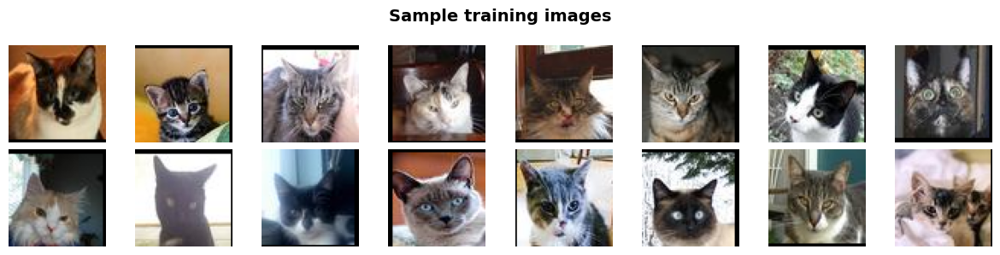

In [6]:
loader = get_dataloader(
    CONFIG["data_dir"],
    image_size=CONFIG["image_size"],
    batch_size=CONFIG["batch_size"],
    augment=True,
)

print(f"Images: {len(loader.dataset)}")
print(f"Batches/epoch: {len(loader)}")

batch = next(iter(loader))
plot_image_grid(batch[:16], title="Sample training images", nrow=8)

In [7]:
def train_one_seed(config, seed):
    """
    Full training run for one seed.
    Returns (model, result_dict).
    """
    set_seed(seed)
    seed_dir = Path(config["checkpoint_dir"]) / f"seed_{seed}"
    seed_dir.mkdir(parents=True, exist_ok=True)

    model = VAE(image_size=config["image_size"], latent_dim=config["latent_dim"],
        base_channels=config["base_channels"]).to(device)

    optimizer = optim.Adam(model.parameters(), lr=config["lr"])
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=0.5)

    history = {"total": [], "recon": [], "kl": []}
    best_loss = float("inf")

    for epoch in range(1, config["epochs"] + 1):
        model.train()
        total_loss = recon_loss_sum = kl_loss_sum = 0.0

        for batch in loader:
            x = batch.to(device)
            optimizer.zero_grad()
            recon, mu, log_var = model(x)
            loss, rl, kl = vae_loss(recon, x, mu, log_var, beta=config["beta"])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            total_loss += loss.item()
            recon_loss_sum += rl.item()
            kl_loss_sum += kl.item()

        n = len(loader)
        avg_total = total_loss / n
        avg_recon = recon_loss_sum / n
        avg_kl = kl_loss_sum / n

        history["total"].append(avg_total)
        history["recon"].append(avg_recon)
        history["kl"].append(avg_kl)

        scheduler.step(avg_total)

        print(f"  [seed={seed}] Epoch [{epoch:3d}/{config['epochs']}] "
              f"Loss: {avg_total:.4f} "
              f"(recon={avg_recon:.4f}, kl={avg_kl:.4f})")

        if avg_total < best_loss:
            best_loss = avg_total
            torch.save(model.state_dict(), seed_dir / "vae_best.pt")

        if epoch % config["sample_interval"] == 0:
            model.eval()
            with torch.no_grad():
                samples = model.generate(16, device)
            plot_image_grid(samples,
                title=f"Generated — seed {seed}, epoch {epoch}",
                save_path=str(seed_dir / f"samples_epoch_{epoch:03d}.png"))
            model.train()

    # load best checkpoint for evaluation
    model.load_state_dict(torch.load(seed_dir / "vae_best.pt"))

    # evaluate — universal generate_fn interface
    metrics = evaluate_model(
        generate_fn=lambda n: model.generate(n, device),
        real_loader=loader,
        device=device,
        n_samples=config["n_eval_samples"],
    )

    result = {
        "seed": seed,
        "history": history,
        "fid": metrics["fid"],
        "is_mean": metrics["is_mean"],
        "is_std": metrics["is_std"],
    }

    save_results(result, str(seed_dir / "result.json"))
    return model, result

In [12]:
def experiment_train_latent_dim(config):
    latent_results = {}
    latent_models = {}

    for latent_dim in LATDIM_VALUES:

        print("\n" + "=" * 70)
        print(f"Training VAE for latent_dim = {latent_dim}")
        print("=" * 70)

        config_ld = copy.deepcopy(config)

        config_ld["latent_dim"] = latent_dim

        latent_name = f"latent_dim_{latent_dim}"
        config_ld["checkpoint_dir"] = f"{config['checkpoint_dir']}/{latent_name}"

        Path(config_ld["checkpoint_dir"]).mkdir(parents=True, exist_ok=True)

        seed_results = {}
        seed_models = {}

        for seed in config_ld["seeds"]:

            print("\n" + "-" * 55)
            print(f"Training latent_dim={latent_dim} seed={seed}")
            print("-" * 55)

            model, result = train_one_seed(config_ld, seed)

            result["latent_dim"] = latent_dim

            seed_results[seed] = result
            seed_models[seed] = model

        latent_results[latent_dim] = seed_results
        latent_models[latent_dim] = seed_models

        save_results(
            {
                "latent_dim": latent_dim,
                "results": seed_results,
            },
            f"{config_ld['checkpoint_dir']}/all_results.json",
        )

    return latent_results, latent_models


Training VAE for latent_dim = 64

-------------------------------------------------------
Training latent_dim=64 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.3218 (recon=0.2801, kl=0.0417)
  [seed=42] Epoch [  2/50] Loss: 0.2574 (recon=0.2179, kl=0.0395)
  [seed=42] Epoch [  3/50] Loss: 0.2469 (recon=0.2072, kl=0.0396)
  [seed=42] Epoch [  4/50] Loss: 0.2424 (recon=0.2024, kl=0.0400)
  [seed=42] Epoch [  5/50] Loss: 0.2403 (recon=0.2005, kl=0.0398)
  [seed=42] Epoch [  6/50] Loss: 0.2397 (recon=0.2000, kl=0.0397)
  [seed=42] Epoch [  7/50] Loss: 0.2392 (recon=0.1993, kl=0.0399)
  [seed=42] Epoch [  8/50] Loss: 0.2390 (recon=0.1994, kl=0.0397)
  [seed=42] Epoch [  9/50] Loss: 0.2377 (recon=0.1979, kl=0.0398)
  [seed=42] Epoch [ 10/50] Loss: 0.2379 (recon=0.1978, kl=0.0401)


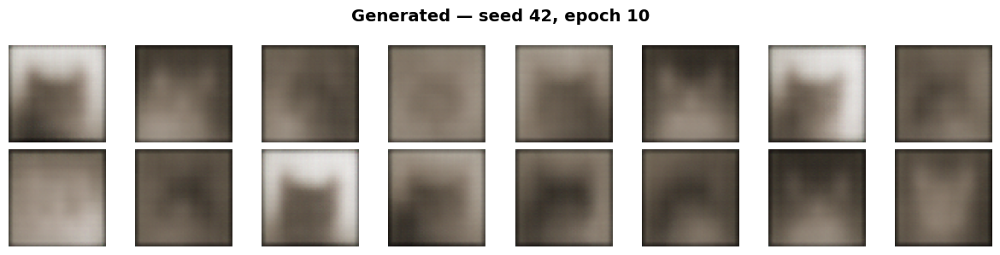

  [seed=42] Epoch [ 11/50] Loss: 0.2374 (recon=0.1968, kl=0.0406)
  [seed=42] Epoch [ 12/50] Loss: 0.2369 (recon=0.1956, kl=0.0413)
  [seed=42] Epoch [ 13/50] Loss: 0.2367 (recon=0.1949, kl=0.0418)
  [seed=42] Epoch [ 14/50] Loss: 0.2366 (recon=0.1944, kl=0.0422)
  [seed=42] Epoch [ 15/50] Loss: 0.2365 (recon=0.1940, kl=0.0425)
  [seed=42] Epoch [ 16/50] Loss: 0.2366 (recon=0.1936, kl=0.0429)
  [seed=42] Epoch [ 17/50] Loss: 0.2361 (recon=0.1928, kl=0.0432)
  [seed=42] Epoch [ 18/50] Loss: 0.2352 (recon=0.1923, kl=0.0429)
  [seed=42] Epoch [ 19/50] Loss: 0.2346 (recon=0.1914, kl=0.0432)
  [seed=42] Epoch [ 20/50] Loss: 0.2351 (recon=0.1917, kl=0.0434)


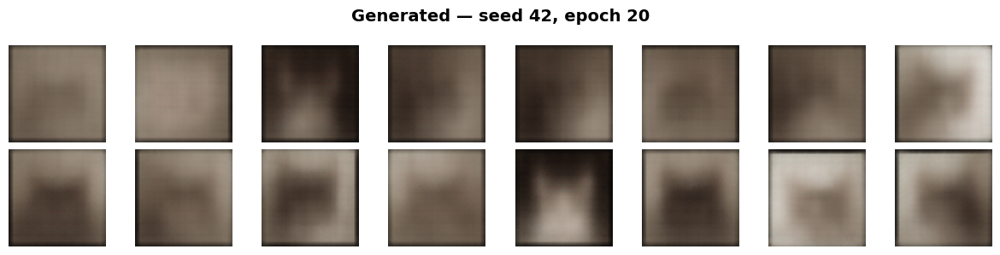

  [seed=42] Epoch [ 21/50] Loss: 0.2348 (recon=0.1911, kl=0.0437)
  [seed=42] Epoch [ 22/50] Loss: 0.2342 (recon=0.1908, kl=0.0434)
  [seed=42] Epoch [ 23/50] Loss: 0.2340 (recon=0.1902, kl=0.0438)
  [seed=42] Epoch [ 24/50] Loss: 0.2335 (recon=0.1895, kl=0.0440)
  [seed=42] Epoch [ 25/50] Loss: 0.2336 (recon=0.1897, kl=0.0438)
  [seed=42] Epoch [ 26/50] Loss: 0.2340 (recon=0.1897, kl=0.0443)
  [seed=42] Epoch [ 27/50] Loss: 0.2334 (recon=0.1888, kl=0.0446)
  [seed=42] Epoch [ 28/50] Loss: 0.2334 (recon=0.1889, kl=0.0446)
  [seed=42] Epoch [ 29/50] Loss: 0.2329 (recon=0.1880, kl=0.0449)
  [seed=42] Epoch [ 30/50] Loss: 0.2333 (recon=0.1878, kl=0.0454)


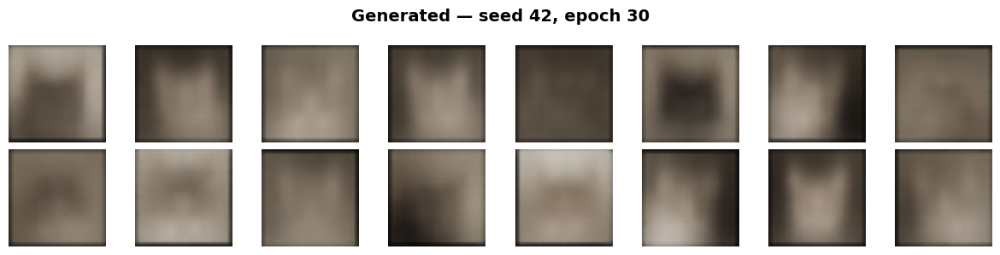

  [seed=42] Epoch [ 31/50] Loss: 0.2330 (recon=0.1880, kl=0.0449)
  [seed=42] Epoch [ 32/50] Loss: 0.2327 (recon=0.1877, kl=0.0450)
  [seed=42] Epoch [ 33/50] Loss: 0.2327 (recon=0.1872, kl=0.0454)
  [seed=42] Epoch [ 34/50] Loss: 0.2324 (recon=0.1877, kl=0.0447)
  [seed=42] Epoch [ 35/50] Loss: 0.2326 (recon=0.1870, kl=0.0456)
  [seed=42] Epoch [ 36/50] Loss: 0.2321 (recon=0.1867, kl=0.0454)
  [seed=42] Epoch [ 37/50] Loss: 0.2325 (recon=0.1873, kl=0.0453)
  [seed=42] Epoch [ 38/50] Loss: 0.2322 (recon=0.1868, kl=0.0454)
  [seed=42] Epoch [ 39/50] Loss: 0.2321 (recon=0.1862, kl=0.0459)
  [seed=42] Epoch [ 40/50] Loss: 0.2323 (recon=0.1863, kl=0.0460)


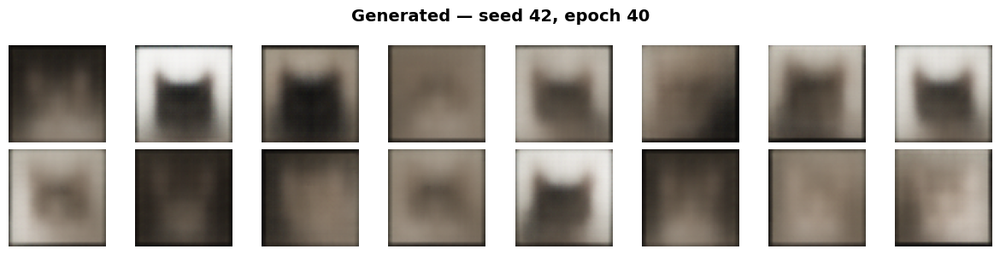

  [seed=42] Epoch [ 41/50] Loss: 0.2316 (recon=0.1857, kl=0.0459)
  [seed=42] Epoch [ 42/50] Loss: 0.2322 (recon=0.1864, kl=0.0458)
  [seed=42] Epoch [ 43/50] Loss: 0.2312 (recon=0.1853, kl=0.0459)
  [seed=42] Epoch [ 44/50] Loss: 0.2318 (recon=0.1851, kl=0.0467)
  [seed=42] Epoch [ 45/50] Loss: 0.2315 (recon=0.1850, kl=0.0465)
  [seed=42] Epoch [ 46/50] Loss: 0.2315 (recon=0.1847, kl=0.0469)
  [seed=42] Epoch [ 47/50] Loss: 0.2318 (recon=0.1846, kl=0.0472)
  [seed=42] Epoch [ 48/50] Loss: 0.2314 (recon=0.1845, kl=0.0469)
  [seed=42] Epoch [ 49/50] Loss: 0.2315 (recon=0.1842, kl=0.0473)
  [seed=42] Epoch [ 50/50] Loss: 0.2306 (recon=0.1833, kl=0.0473)


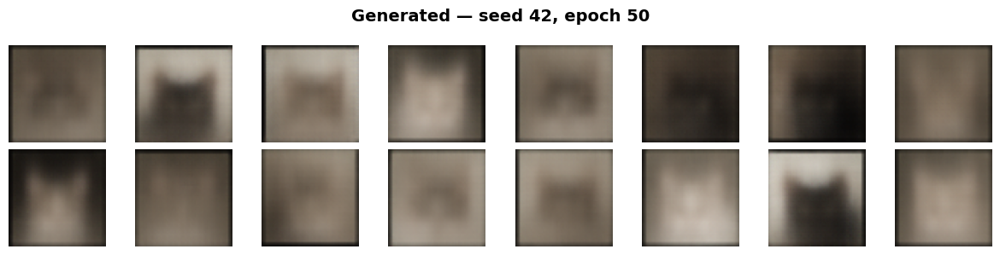

Evaluating with 1000 samples...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 240MB/s] 


  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:07, 18.34it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 293.89  (lower is better)
Inception Score: 1.36 +/- 0.04  (higher is better)

-------------------------------------------------------
Training latent_dim=64 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.3070 (recon=0.2604, kl=0.0466)
  [seed=123] Epoch [  2/50] Loss: 0.2557 (recon=0.2162, kl=0.0395)
  [seed=123] Epoch [  3/50] Loss: 0.2460 (recon=0.2075, kl=0.0385)
  [seed=123] Epoch [  4/50] Loss: 0.2438 (recon=0.2048, kl=0.0390)
  [seed=123] Epoch [  5/50] Loss: 0.2430 (recon=0.2029, kl=0.0401)
  [seed=123] Epoch [  6/50] Loss: 0.2406 (recon=0.2006, kl=0.0401)
  [seed=123] Epoch [  7/50] Loss: 0.2403 (recon=0.2003, kl=0.0400)
  [seed=123] Epoch [  8/50] Loss: 0.2393 (recon=0.1993, kl=0.0399)
  [seed=123] Epoch [  9/50] Loss: 0.2390 (recon=0.1983, kl=0.0407)
  [seed=123] Epoch [ 10/50] Loss: 0.2384 (recon=0.1986, kl=0.0398)


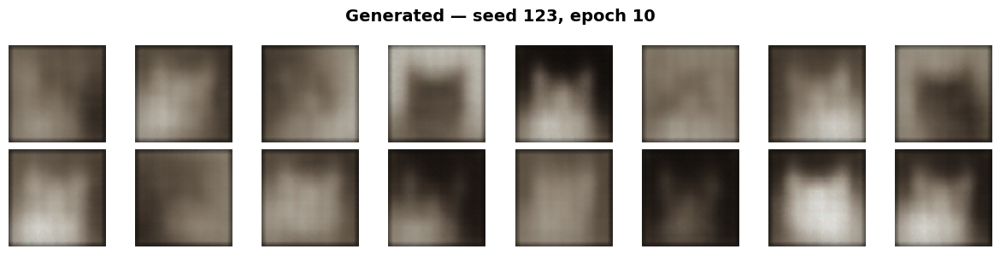

  [seed=123] Epoch [ 11/50] Loss: 0.2377 (recon=0.1983, kl=0.0394)
  [seed=123] Epoch [ 12/50] Loss: 0.2382 (recon=0.1983, kl=0.0399)
  [seed=123] Epoch [ 13/50] Loss: 0.2368 (recon=0.1970, kl=0.0397)
  [seed=123] Epoch [ 14/50] Loss: 0.2375 (recon=0.1971, kl=0.0404)
  [seed=123] Epoch [ 15/50] Loss: 0.2376 (recon=0.1964, kl=0.0412)
  [seed=123] Epoch [ 16/50] Loss: 0.2372 (recon=0.1959, kl=0.0413)
  [seed=123] Epoch [ 17/50] Loss: 0.2363 (recon=0.1937, kl=0.0426)
  [seed=123] Epoch [ 18/50] Loss: 0.2358 (recon=0.1933, kl=0.0425)
  [seed=123] Epoch [ 19/50] Loss: 0.2360 (recon=0.1929, kl=0.0431)
  [seed=123] Epoch [ 20/50] Loss: 0.2356 (recon=0.1926, kl=0.0430)


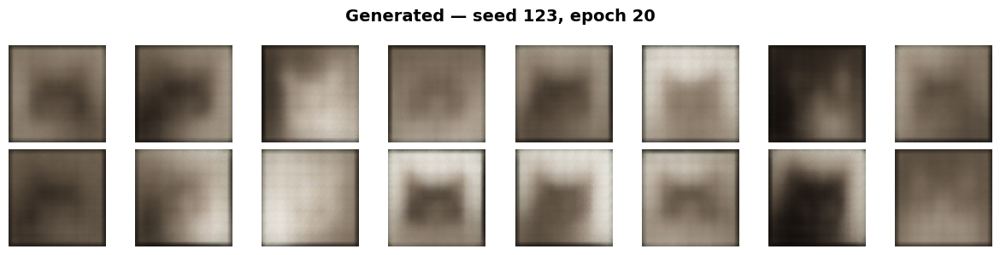

  [seed=123] Epoch [ 21/50] Loss: 0.2348 (recon=0.1916, kl=0.0433)
  [seed=123] Epoch [ 22/50] Loss: 0.2348 (recon=0.1918, kl=0.0431)
  [seed=123] Epoch [ 23/50] Loss: 0.2344 (recon=0.1913, kl=0.0431)
  [seed=123] Epoch [ 24/50] Loss: 0.2343 (recon=0.1908, kl=0.0434)
  [seed=123] Epoch [ 25/50] Loss: 0.2344 (recon=0.1909, kl=0.0435)
  [seed=123] Epoch [ 26/50] Loss: 0.2335 (recon=0.1898, kl=0.0436)
  [seed=123] Epoch [ 27/50] Loss: 0.2338 (recon=0.1896, kl=0.0442)
  [seed=123] Epoch [ 28/50] Loss: 0.2340 (recon=0.1891, kl=0.0450)
  [seed=123] Epoch [ 29/50] Loss: 0.2332 (recon=0.1886, kl=0.0446)
  [seed=123] Epoch [ 30/50] Loss: 0.2334 (recon=0.1886, kl=0.0448)


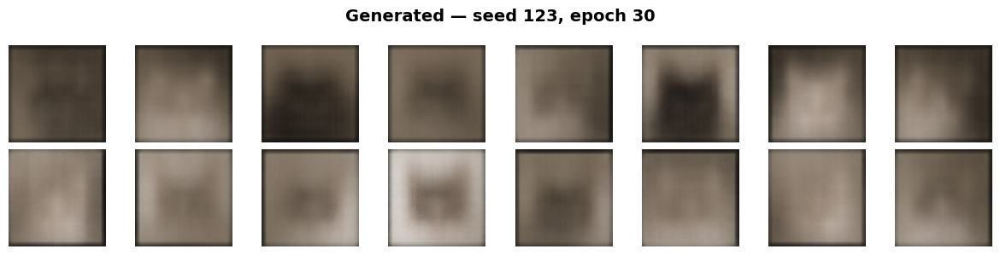

  [seed=123] Epoch [ 31/50] Loss: 0.2327 (recon=0.1881, kl=0.0446)
  [seed=123] Epoch [ 32/50] Loss: 0.2333 (recon=0.1879, kl=0.0454)
  [seed=123] Epoch [ 33/50] Loss: 0.2329 (recon=0.1874, kl=0.0456)
  [seed=123] Epoch [ 34/50] Loss: 0.2329 (recon=0.1876, kl=0.0453)
  [seed=123] Epoch [ 35/50] Loss: 0.2328 (recon=0.1874, kl=0.0454)
  [seed=123] Epoch [ 36/50] Loss: 0.2321 (recon=0.1865, kl=0.0457)
  [seed=123] Epoch [ 37/50] Loss: 0.2325 (recon=0.1871, kl=0.0454)
  [seed=123] Epoch [ 38/50] Loss: 0.2323 (recon=0.1868, kl=0.0455)
  [seed=123] Epoch [ 39/50] Loss: 0.2325 (recon=0.1873, kl=0.0452)
  [seed=123] Epoch [ 40/50] Loss: 0.2320 (recon=0.1863, kl=0.0457)


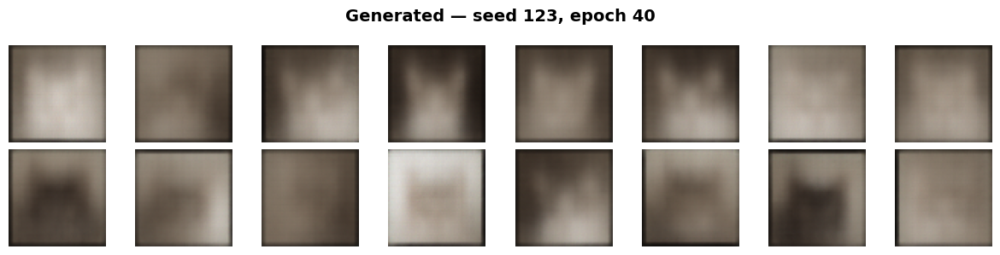

  [seed=123] Epoch [ 41/50] Loss: 0.2317 (recon=0.1864, kl=0.0452)
  [seed=123] Epoch [ 42/50] Loss: 0.2328 (recon=0.1873, kl=0.0455)
  [seed=123] Epoch [ 43/50] Loss: 0.2323 (recon=0.1866, kl=0.0457)
  [seed=123] Epoch [ 44/50] Loss: 0.2323 (recon=0.1862, kl=0.0461)
  [seed=123] Epoch [ 45/50] Loss: 0.2318 (recon=0.1862, kl=0.0456)
  [seed=123] Epoch [ 46/50] Loss: 0.2318 (recon=0.1861, kl=0.0457)
  [seed=123] Epoch [ 47/50] Loss: 0.2323 (recon=0.1864, kl=0.0460)
  [seed=123] Epoch [ 48/50] Loss: 0.2312 (recon=0.1856, kl=0.0456)
  [seed=123] Epoch [ 49/50] Loss: 0.2313 (recon=0.1854, kl=0.0459)
  [seed=123] Epoch [ 50/50] Loss: 0.2311 (recon=0.1847, kl=0.0464)


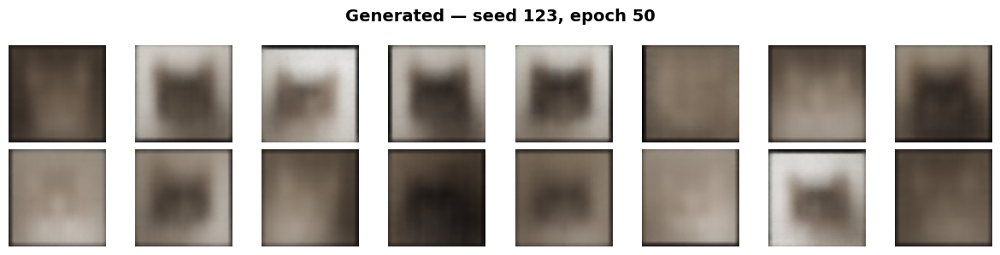

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:07, 17.97it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 292.10  (lower is better)
Inception Score: 1.41 +/- 0.04  (higher is better)

-------------------------------------------------------
Training latent_dim=64 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.3144 (recon=0.2644, kl=0.0500)
  [seed=456] Epoch [  2/50] Loss: 0.2616 (recon=0.2224, kl=0.0392)
  [seed=456] Epoch [  3/50] Loss: 0.2519 (recon=0.2137, kl=0.0382)
  [seed=456] Epoch [  4/50] Loss: 0.2461 (recon=0.2074, kl=0.0387)
  [seed=456] Epoch [  5/50] Loss: 0.2438 (recon=0.2056, kl=0.0383)
  [seed=456] Epoch [  6/50] Loss: 0.2426 (recon=0.2046, kl=0.0380)
  [seed=456] Epoch [  7/50] Loss: 0.2408 (recon=0.2017, kl=0.0391)
  [seed=456] Epoch [  8/50] Loss: 0.2394 (recon=0.2003, kl=0.0391)
  [seed=456] Epoch [  9/50] Loss: 0.2390 (recon=0.1993, kl=0.0397)
  [seed=456] Epoch [ 10/50] Loss: 0.2382 (recon=0.1984, kl=0.0398)


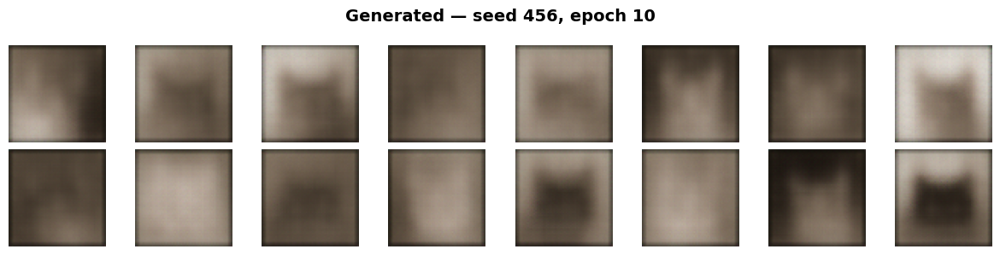

  [seed=456] Epoch [ 11/50] Loss: 0.2381 (recon=0.1981, kl=0.0400)
  [seed=456] Epoch [ 12/50] Loss: 0.2373 (recon=0.1976, kl=0.0397)
  [seed=456] Epoch [ 13/50] Loss: 0.2378 (recon=0.1972, kl=0.0406)
  [seed=456] Epoch [ 14/50] Loss: 0.2374 (recon=0.1968, kl=0.0407)
  [seed=456] Epoch [ 15/50] Loss: 0.2365 (recon=0.1958, kl=0.0407)
  [seed=456] Epoch [ 16/50] Loss: 0.2361 (recon=0.1951, kl=0.0410)
  [seed=456] Epoch [ 17/50] Loss: 0.2364 (recon=0.1949, kl=0.0415)
  [seed=456] Epoch [ 18/50] Loss: 0.2361 (recon=0.1944, kl=0.0417)
  [seed=456] Epoch [ 19/50] Loss: 0.2357 (recon=0.1938, kl=0.0419)
  [seed=456] Epoch [ 20/50] Loss: 0.2354 (recon=0.1932, kl=0.0422)


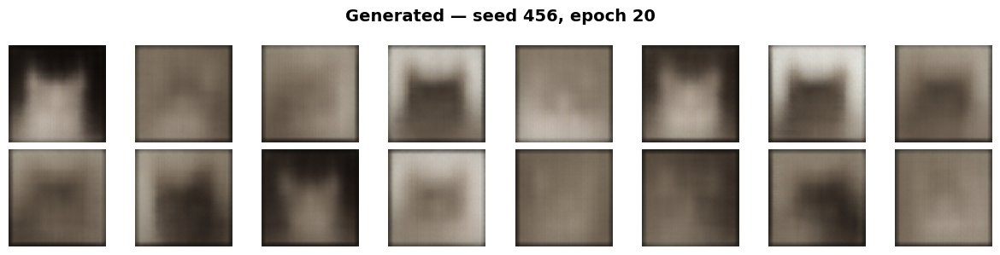

  [seed=456] Epoch [ 21/50] Loss: 0.2356 (recon=0.1931, kl=0.0425)
  [seed=456] Epoch [ 22/50] Loss: 0.2353 (recon=0.1924, kl=0.0429)
  [seed=456] Epoch [ 23/50] Loss: 0.2348 (recon=0.1918, kl=0.0430)
  [seed=456] Epoch [ 24/50] Loss: 0.2344 (recon=0.1911, kl=0.0433)
  [seed=456] Epoch [ 25/50] Loss: 0.2341 (recon=0.1909, kl=0.0431)
  [seed=456] Epoch [ 26/50] Loss: 0.2343 (recon=0.1915, kl=0.0428)
  [seed=456] Epoch [ 27/50] Loss: 0.2342 (recon=0.1914, kl=0.0427)
  [seed=456] Epoch [ 28/50] Loss: 0.2344 (recon=0.1912, kl=0.0432)
  [seed=456] Epoch [ 29/50] Loss: 0.2341 (recon=0.1912, kl=0.0429)
  [seed=456] Epoch [ 30/50] Loss: 0.2335 (recon=0.1906, kl=0.0430)


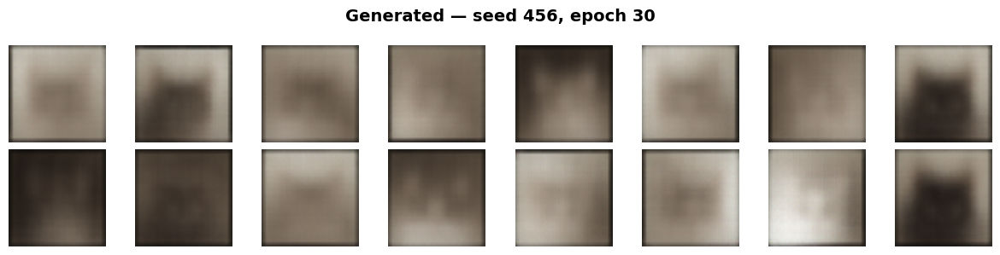

  [seed=456] Epoch [ 31/50] Loss: 0.2337 (recon=0.1906, kl=0.0431)
  [seed=456] Epoch [ 32/50] Loss: 0.2335 (recon=0.1904, kl=0.0431)
  [seed=456] Epoch [ 33/50] Loss: 0.2334 (recon=0.1907, kl=0.0427)
  [seed=456] Epoch [ 34/50] Loss: 0.2339 (recon=0.1905, kl=0.0434)
  [seed=456] Epoch [ 35/50] Loss: 0.2337 (recon=0.1904, kl=0.0433)
  [seed=456] Epoch [ 36/50] Loss: 0.2339 (recon=0.1904, kl=0.0435)
  [seed=456] Epoch [ 37/50] Loss: 0.2331 (recon=0.1897, kl=0.0434)
  [seed=456] Epoch [ 38/50] Loss: 0.2330 (recon=0.1898, kl=0.0432)
  [seed=456] Epoch [ 39/50] Loss: 0.2329 (recon=0.1891, kl=0.0438)
  [seed=456] Epoch [ 40/50] Loss: 0.2331 (recon=0.1895, kl=0.0436)


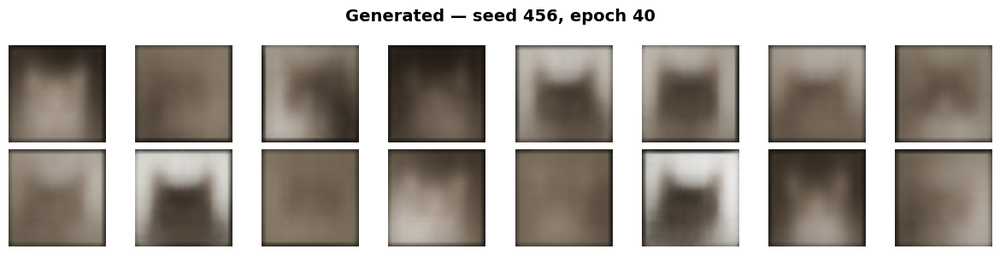

  [seed=456] Epoch [ 41/50] Loss: 0.2329 (recon=0.1892, kl=0.0437)
  [seed=456] Epoch [ 42/50] Loss: 0.2328 (recon=0.1882, kl=0.0445)
  [seed=456] Epoch [ 43/50] Loss: 0.2329 (recon=0.1888, kl=0.0441)
  [seed=456] Epoch [ 44/50] Loss: 0.2327 (recon=0.1878, kl=0.0449)
  [seed=456] Epoch [ 45/50] Loss: 0.2324 (recon=0.1874, kl=0.0450)
  [seed=456] Epoch [ 46/50] Loss: 0.2328 (recon=0.1873, kl=0.0455)
  [seed=456] Epoch [ 47/50] Loss: 0.2323 (recon=0.1868, kl=0.0455)
  [seed=456] Epoch [ 48/50] Loss: 0.2326 (recon=0.1872, kl=0.0454)
  [seed=456] Epoch [ 49/50] Loss: 0.2319 (recon=0.1867, kl=0.0453)
  [seed=456] Epoch [ 50/50] Loss: 0.2321 (recon=0.1865, kl=0.0456)


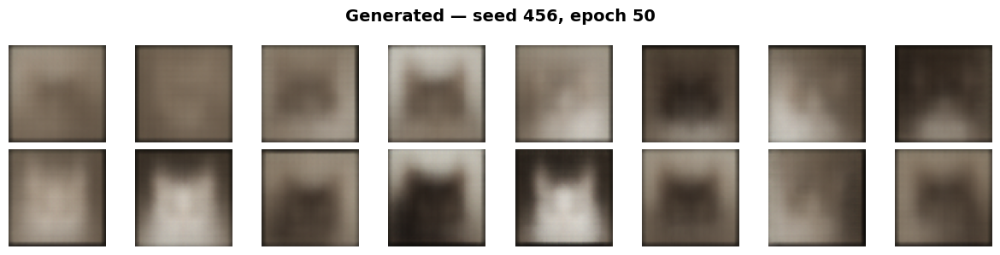

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.81it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 299.67  (lower is better)
Inception Score: 1.42 +/- 0.02  (higher is better)

Training VAE for latent_dim = 128

-------------------------------------------------------
Training latent_dim=128 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.3005 (recon=0.2527, kl=0.0478)
  [seed=42] Epoch [  2/50] Loss: 0.2354 (recon=0.1959, kl=0.0395)
  [seed=42] Epoch [  3/50] Loss: 0.2224 (recon=0.1836, kl=0.0389)
  [seed=42] Epoch [  4/50] Loss: 0.2188 (recon=0.1795, kl=0.0393)
  [seed=42] Epoch [  5/50] Loss: 0.2159 (recon=0.1758, kl=0.0401)
  [seed=42] Epoch [  6/50] Loss: 0.2134 (recon=0.1728, kl=0.0406)
  [seed=42] Epoch [  7/50] Loss: 0.2119 (recon=0.1707, kl=0.0412)
  [seed=42] Epoch [  8/50] Loss: 0.2110 (recon=0.1694, kl=0.0416)
  [seed=42] Epoch [  9/50] Loss: 0.2103 (recon=0.1688, kl=0.0415)
  [seed=42] Epoch [ 10/50] Loss: 0.2094 (recon

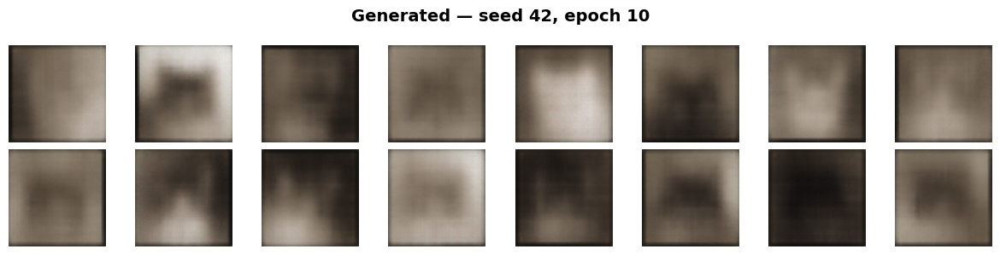

  [seed=42] Epoch [ 11/50] Loss: 0.2093 (recon=0.1673, kl=0.0420)
  [seed=42] Epoch [ 12/50] Loss: 0.2078 (recon=0.1655, kl=0.0423)
  [seed=42] Epoch [ 13/50] Loss: 0.2065 (recon=0.1636, kl=0.0428)
  [seed=42] Epoch [ 14/50] Loss: 0.2060 (recon=0.1621, kl=0.0438)
  [seed=42] Epoch [ 15/50] Loss: 0.2052 (recon=0.1611, kl=0.0440)
  [seed=42] Epoch [ 16/50] Loss: 0.2042 (recon=0.1599, kl=0.0442)
  [seed=42] Epoch [ 17/50] Loss: 0.2037 (recon=0.1592, kl=0.0445)
  [seed=42] Epoch [ 18/50] Loss: 0.2031 (recon=0.1584, kl=0.0447)
  [seed=42] Epoch [ 19/50] Loss: 0.2025 (recon=0.1576, kl=0.0450)
  [seed=42] Epoch [ 20/50] Loss: 0.2021 (recon=0.1571, kl=0.0450)


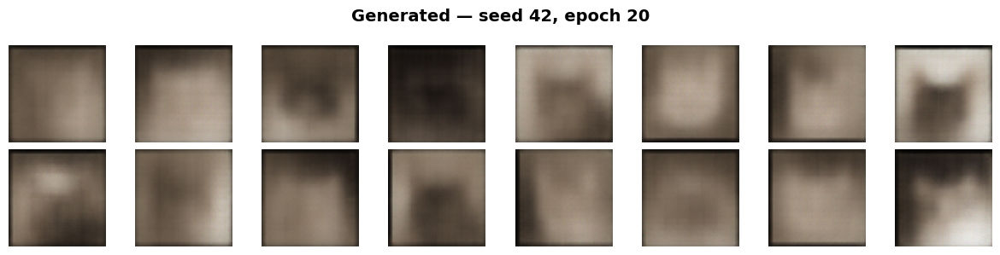

  [seed=42] Epoch [ 21/50] Loss: 0.2019 (recon=0.1568, kl=0.0451)
  [seed=42] Epoch [ 22/50] Loss: 0.2019 (recon=0.1565, kl=0.0454)
  [seed=42] Epoch [ 23/50] Loss: 0.2014 (recon=0.1561, kl=0.0453)
  [seed=42] Epoch [ 24/50] Loss: 0.2009 (recon=0.1554, kl=0.0455)
  [seed=42] Epoch [ 25/50] Loss: 0.2011 (recon=0.1558, kl=0.0454)
  [seed=42] Epoch [ 26/50] Loss: 0.2006 (recon=0.1553, kl=0.0453)
  [seed=42] Epoch [ 27/50] Loss: 0.2003 (recon=0.1548, kl=0.0455)
  [seed=42] Epoch [ 28/50] Loss: 0.2003 (recon=0.1548, kl=0.0456)
  [seed=42] Epoch [ 29/50] Loss: 0.2002 (recon=0.1546, kl=0.0456)
  [seed=42] Epoch [ 30/50] Loss: 0.2004 (recon=0.1547, kl=0.0457)


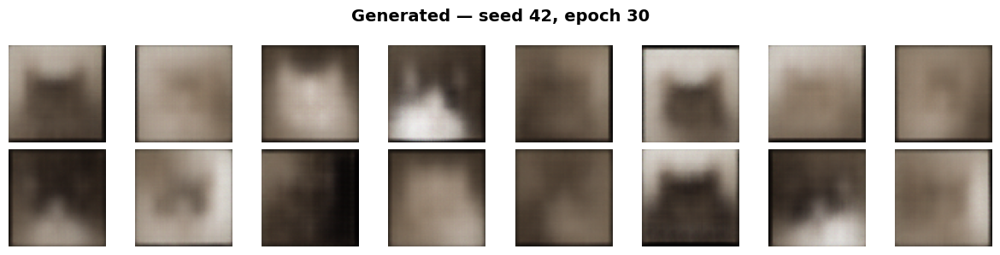

  [seed=42] Epoch [ 31/50] Loss: 0.1999 (recon=0.1545, kl=0.0454)
  [seed=42] Epoch [ 32/50] Loss: 0.1997 (recon=0.1541, kl=0.0456)
  [seed=42] Epoch [ 33/50] Loss: 0.2002 (recon=0.1544, kl=0.0458)
  [seed=42] Epoch [ 34/50] Loss: 0.1996 (recon=0.1535, kl=0.0461)
  [seed=42] Epoch [ 35/50] Loss: 0.1992 (recon=0.1534, kl=0.0458)
  [seed=42] Epoch [ 36/50] Loss: 0.1989 (recon=0.1532, kl=0.0456)
  [seed=42] Epoch [ 37/50] Loss: 0.1995 (recon=0.1536, kl=0.0459)
  [seed=42] Epoch [ 38/50] Loss: 0.1991 (recon=0.1532, kl=0.0459)
  [seed=42] Epoch [ 39/50] Loss: 0.1995 (recon=0.1536, kl=0.0459)
  [seed=42] Epoch [ 40/50] Loss: 0.1992 (recon=0.1531, kl=0.0461)


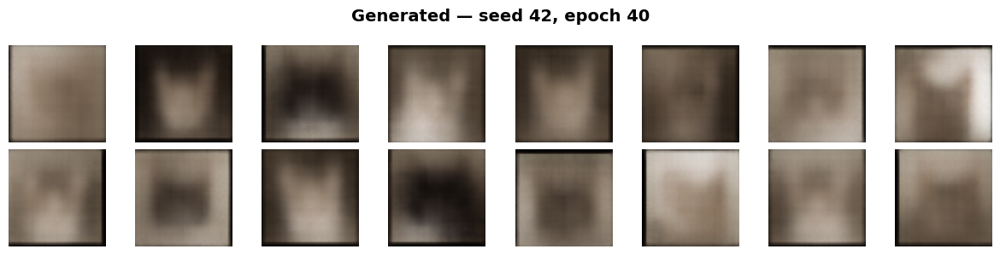

  [seed=42] Epoch [ 41/50] Loss: 0.1987 (recon=0.1527, kl=0.0460)
  [seed=42] Epoch [ 42/50] Loss: 0.1990 (recon=0.1530, kl=0.0460)
  [seed=42] Epoch [ 43/50] Loss: 0.1985 (recon=0.1525, kl=0.0461)
  [seed=42] Epoch [ 44/50] Loss: 0.1985 (recon=0.1524, kl=0.0460)
  [seed=42] Epoch [ 45/50] Loss: 0.1984 (recon=0.1521, kl=0.0464)
  [seed=42] Epoch [ 46/50] Loss: 0.1981 (recon=0.1520, kl=0.0461)
  [seed=42] Epoch [ 47/50] Loss: 0.1981 (recon=0.1520, kl=0.0461)
  [seed=42] Epoch [ 48/50] Loss: 0.1980 (recon=0.1517, kl=0.0462)
  [seed=42] Epoch [ 49/50] Loss: 0.1979 (recon=0.1514, kl=0.0464)
  [seed=42] Epoch [ 50/50] Loss: 0.1980 (recon=0.1511, kl=0.0469)


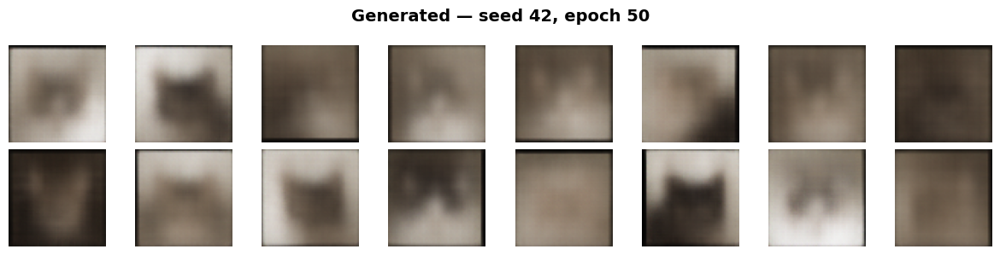

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:01<00:10, 14.10it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 273.94  (lower is better)
Inception Score: 1.42 +/- 0.03  (higher is better)

-------------------------------------------------------
Training latent_dim=128 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.2875 (recon=0.2394, kl=0.0481)
  [seed=123] Epoch [  2/50] Loss: 0.2399 (recon=0.2002, kl=0.0396)
  [seed=123] Epoch [  3/50] Loss: 0.2233 (recon=0.1847, kl=0.0386)
  [seed=123] Epoch [  4/50] Loss: 0.2164 (recon=0.1775, kl=0.0389)
  [seed=123] Epoch [  5/50] Loss: 0.2144 (recon=0.1741, kl=0.0403)
  [seed=123] Epoch [  6/50] Loss: 0.2135 (recon=0.1721, kl=0.0415)
  [seed=123] Epoch [  7/50] Loss: 0.2121 (recon=0.1699, kl=0.0422)
  [seed=123] Epoch [  8/50] Loss: 0.2103 (recon=0.1676, kl=0.0427)
  [seed=123] Epoch [  9/50] Loss: 0.2088 (recon=0.1662, kl=0.0426)
  [seed=123] Epoch [ 10/50] Loss: 0.2087 (recon=0.1659, kl=0.0428)


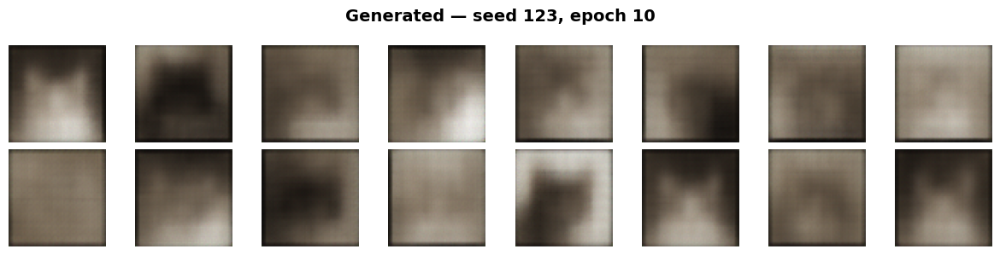

  [seed=123] Epoch [ 11/50] Loss: 0.2071 (recon=0.1642, kl=0.0429)
  [seed=123] Epoch [ 12/50] Loss: 0.2075 (recon=0.1649, kl=0.0425)
  [seed=123] Epoch [ 13/50] Loss: 0.2062 (recon=0.1637, kl=0.0425)
  [seed=123] Epoch [ 14/50] Loss: 0.2057 (recon=0.1629, kl=0.0427)
  [seed=123] Epoch [ 15/50] Loss: 0.2049 (recon=0.1619, kl=0.0430)
  [seed=123] Epoch [ 16/50] Loss: 0.2043 (recon=0.1607, kl=0.0437)
  [seed=123] Epoch [ 17/50] Loss: 0.2033 (recon=0.1594, kl=0.0439)
  [seed=123] Epoch [ 18/50] Loss: 0.2022 (recon=0.1576, kl=0.0446)
  [seed=123] Epoch [ 19/50] Loss: 0.2017 (recon=0.1567, kl=0.0450)
  [seed=123] Epoch [ 20/50] Loss: 0.2013 (recon=0.1559, kl=0.0454)


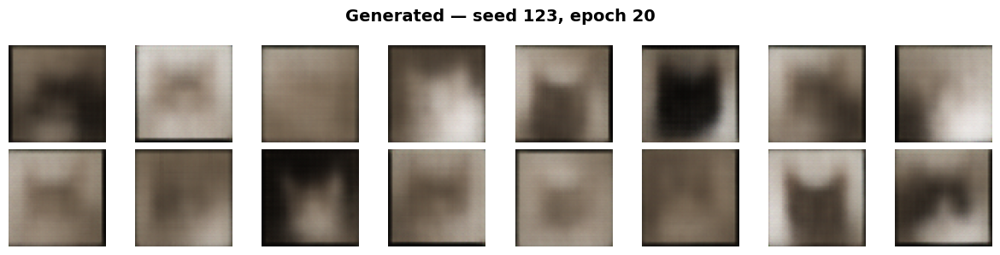

  [seed=123] Epoch [ 21/50] Loss: 0.2010 (recon=0.1557, kl=0.0453)
  [seed=123] Epoch [ 22/50] Loss: 0.2006 (recon=0.1546, kl=0.0461)
  [seed=123] Epoch [ 23/50] Loss: 0.2002 (recon=0.1543, kl=0.0459)
  [seed=123] Epoch [ 24/50] Loss: 0.1996 (recon=0.1532, kl=0.0464)
  [seed=123] Epoch [ 25/50] Loss: 0.1996 (recon=0.1531, kl=0.0465)
  [seed=123] Epoch [ 26/50] Loss: 0.1999 (recon=0.1535, kl=0.0464)
  [seed=123] Epoch [ 27/50] Loss: 0.1993 (recon=0.1528, kl=0.0465)
  [seed=123] Epoch [ 28/50] Loss: 0.1992 (recon=0.1528, kl=0.0465)
  [seed=123] Epoch [ 29/50] Loss: 0.1991 (recon=0.1524, kl=0.0467)
  [seed=123] Epoch [ 30/50] Loss: 0.1984 (recon=0.1519, kl=0.0466)


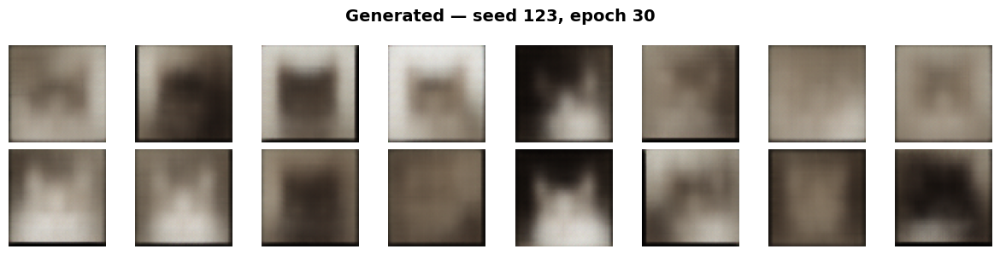

  [seed=123] Epoch [ 31/50] Loss: 0.1985 (recon=0.1519, kl=0.0466)
  [seed=123] Epoch [ 32/50] Loss: 0.1986 (recon=0.1516, kl=0.0470)
  [seed=123] Epoch [ 33/50] Loss: 0.1981 (recon=0.1519, kl=0.0462)
  [seed=123] Epoch [ 34/50] Loss: 0.1990 (recon=0.1521, kl=0.0469)
  [seed=123] Epoch [ 35/50] Loss: 0.1981 (recon=0.1514, kl=0.0467)
  [seed=123] Epoch [ 36/50] Loss: 0.1986 (recon=0.1520, kl=0.0466)
  [seed=123] Epoch [ 37/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=123] Epoch [ 38/50] Loss: 0.1980 (recon=0.1511, kl=0.0469)
  [seed=123] Epoch [ 39/50] Loss: 0.1977 (recon=0.1511, kl=0.0466)
  [seed=123] Epoch [ 40/50] Loss: 0.1981 (recon=0.1511, kl=0.0470)


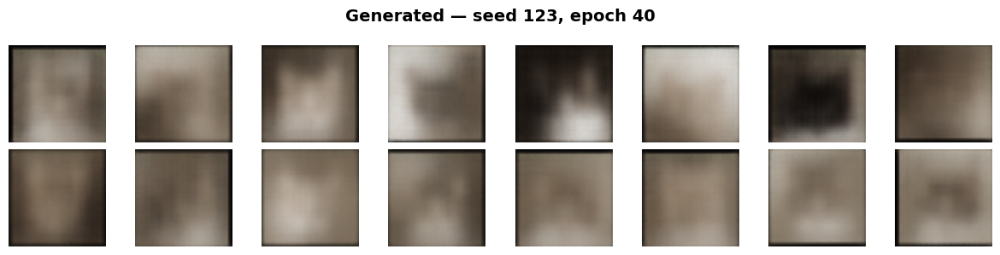

  [seed=123] Epoch [ 41/50] Loss: 0.1979 (recon=0.1509, kl=0.0471)
  [seed=123] Epoch [ 42/50] Loss: 0.1978 (recon=0.1508, kl=0.0471)
  [seed=123] Epoch [ 43/50] Loss: 0.1980 (recon=0.1508, kl=0.0472)
  [seed=123] Epoch [ 44/50] Loss: 0.1977 (recon=0.1506, kl=0.0470)
  [seed=123] Epoch [ 45/50] Loss: 0.1975 (recon=0.1505, kl=0.0470)
  [seed=123] Epoch [ 46/50] Loss: 0.1975 (recon=0.1504, kl=0.0471)
  [seed=123] Epoch [ 47/50] Loss: 0.1976 (recon=0.1506, kl=0.0469)
  [seed=123] Epoch [ 48/50] Loss: 0.1975 (recon=0.1504, kl=0.0471)
  [seed=123] Epoch [ 49/50] Loss: 0.1976 (recon=0.1502, kl=0.0474)
  [seed=123] Epoch [ 50/50] Loss: 0.1973 (recon=0.1501, kl=0.0473)


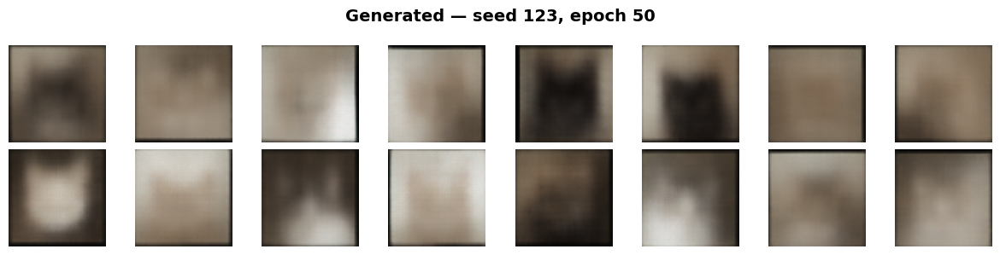

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 17.27it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 273.38  (lower is better)
Inception Score: 1.44 +/- 0.03  (higher is better)

-------------------------------------------------------
Training latent_dim=128 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.2911 (recon=0.2458, kl=0.0453)
  [seed=456] Epoch [  2/50] Loss: 0.2436 (recon=0.2034, kl=0.0402)
  [seed=456] Epoch [  3/50] Loss: 0.2244 (recon=0.1860, kl=0.0384)
  [seed=456] Epoch [  4/50] Loss: 0.2191 (recon=0.1800, kl=0.0392)
  [seed=456] Epoch [  5/50] Loss: 0.2164 (recon=0.1760, kl=0.0404)
  [seed=456] Epoch [  6/50] Loss: 0.2137 (recon=0.1725, kl=0.0412)
  [seed=456] Epoch [  7/50] Loss: 0.2127 (recon=0.1709, kl=0.0418)
  [seed=456] Epoch [  8/50] Loss: 0.2114 (recon=0.1691, kl=0.0423)
  [seed=456] Epoch [  9/50] Loss: 0.2109 (recon=0.1683, kl=0.0426)
  [seed=456] Epoch [ 10/50] Loss: 0.2087 (recon=0.1663, kl=0.0424)


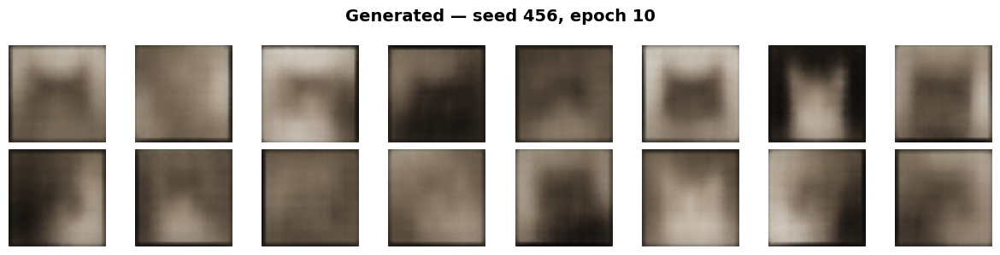

  [seed=456] Epoch [ 11/50] Loss: 0.2085 (recon=0.1662, kl=0.0424)
  [seed=456] Epoch [ 12/50] Loss: 0.2072 (recon=0.1644, kl=0.0428)
  [seed=456] Epoch [ 13/50] Loss: 0.2065 (recon=0.1630, kl=0.0434)
  [seed=456] Epoch [ 14/50] Loss: 0.2058 (recon=0.1622, kl=0.0436)
  [seed=456] Epoch [ 15/50] Loss: 0.2053 (recon=0.1619, kl=0.0434)
  [seed=456] Epoch [ 16/50] Loss: 0.2047 (recon=0.1614, kl=0.0433)
  [seed=456] Epoch [ 17/50] Loss: 0.2037 (recon=0.1598, kl=0.0439)
  [seed=456] Epoch [ 18/50] Loss: 0.2033 (recon=0.1593, kl=0.0440)
  [seed=456] Epoch [ 19/50] Loss: 0.2030 (recon=0.1582, kl=0.0447)
  [seed=456] Epoch [ 20/50] Loss: 0.2023 (recon=0.1573, kl=0.0450)


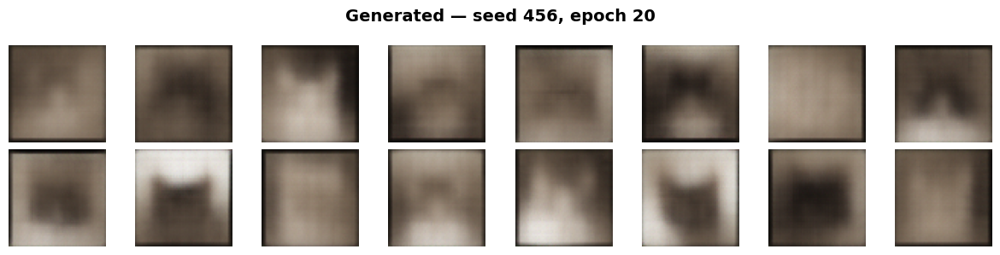

  [seed=456] Epoch [ 21/50] Loss: 0.2015 (recon=0.1556, kl=0.0459)
  [seed=456] Epoch [ 22/50] Loss: 0.2008 (recon=0.1550, kl=0.0458)
  [seed=456] Epoch [ 23/50] Loss: 0.2005 (recon=0.1546, kl=0.0459)
  [seed=456] Epoch [ 24/50] Loss: 0.2003 (recon=0.1542, kl=0.0461)
  [seed=456] Epoch [ 25/50] Loss: 0.1999 (recon=0.1538, kl=0.0461)
  [seed=456] Epoch [ 26/50] Loss: 0.1998 (recon=0.1532, kl=0.0465)
  [seed=456] Epoch [ 27/50] Loss: 0.1997 (recon=0.1534, kl=0.0462)
  [seed=456] Epoch [ 28/50] Loss: 0.1994 (recon=0.1529, kl=0.0464)
  [seed=456] Epoch [ 29/50] Loss: 0.1992 (recon=0.1528, kl=0.0463)
  [seed=456] Epoch [ 30/50] Loss: 0.1988 (recon=0.1524, kl=0.0465)


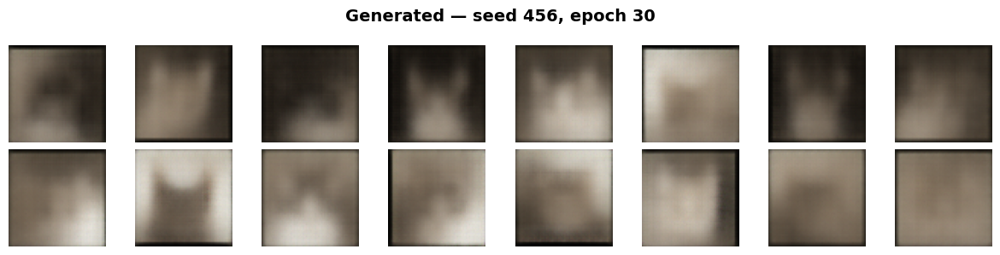

  [seed=456] Epoch [ 31/50] Loss: 0.1987 (recon=0.1524, kl=0.0463)
  [seed=456] Epoch [ 32/50] Loss: 0.1990 (recon=0.1523, kl=0.0468)
  [seed=456] Epoch [ 33/50] Loss: 0.1993 (recon=0.1526, kl=0.0466)
  [seed=456] Epoch [ 34/50] Loss: 0.1986 (recon=0.1521, kl=0.0465)
  [seed=456] Epoch [ 35/50] Loss: 0.1986 (recon=0.1518, kl=0.0467)
  [seed=456] Epoch [ 36/50] Loss: 0.1982 (recon=0.1517, kl=0.0465)
  [seed=456] Epoch [ 37/50] Loss: 0.1986 (recon=0.1518, kl=0.0467)
  [seed=456] Epoch [ 38/50] Loss: 0.1987 (recon=0.1519, kl=0.0468)
  [seed=456] Epoch [ 39/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=456] Epoch [ 40/50] Loss: 0.1981 (recon=0.1515, kl=0.0466)


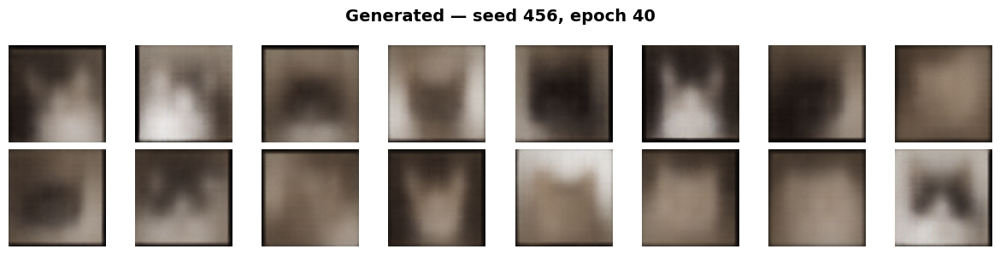

  [seed=456] Epoch [ 41/50] Loss: 0.1981 (recon=0.1514, kl=0.0467)
  [seed=456] Epoch [ 42/50] Loss: 0.1980 (recon=0.1510, kl=0.0470)
  [seed=456] Epoch [ 43/50] Loss: 0.1981 (recon=0.1513, kl=0.0468)
  [seed=456] Epoch [ 44/50] Loss: 0.1984 (recon=0.1513, kl=0.0472)
  [seed=456] Epoch [ 45/50] Loss: 0.1979 (recon=0.1511, kl=0.0467)
  [seed=456] Epoch [ 46/50] Loss: 0.1976 (recon=0.1507, kl=0.0469)
  [seed=456] Epoch [ 47/50] Loss: 0.1981 (recon=0.1512, kl=0.0468)
  [seed=456] Epoch [ 48/50] Loss: 0.1974 (recon=0.1504, kl=0.0471)
  [seed=456] Epoch [ 49/50] Loss: 0.1979 (recon=0.1509, kl=0.0471)
  [seed=456] Epoch [ 50/50] Loss: 0.1981 (recon=0.1509, kl=0.0473)


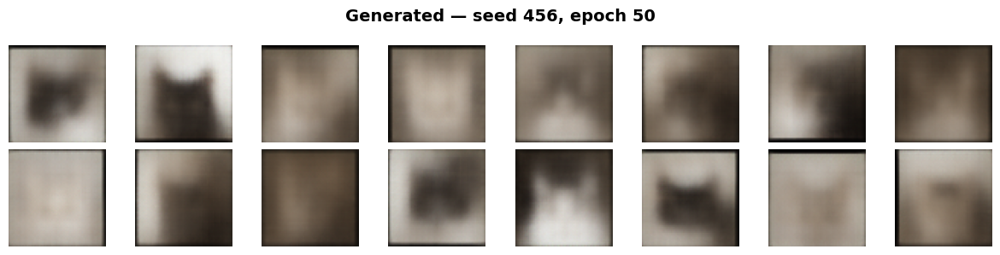

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.22it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 267.17  (lower is better)
Inception Score: 1.39 +/- 0.02  (higher is better)

Training VAE for latent_dim = 256

-------------------------------------------------------
Training latent_dim=256 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.2793 (recon=0.2306, kl=0.0487)
  [seed=42] Epoch [  2/50] Loss: 0.2280 (recon=0.1865, kl=0.0415)
  [seed=42] Epoch [  3/50] Loss: 0.2113 (recon=0.1719, kl=0.0394)
  [seed=42] Epoch [  4/50] Loss: 0.1938 (recon=0.1566, kl=0.0372)
  [seed=42] Epoch [  5/50] Loss: 0.1897 (recon=0.1526, kl=0.0371)
  [seed=42] Epoch [  6/50] Loss: 0.1876 (recon=0.1502, kl=0.0373)
  [seed=42] Epoch [  7/50] Loss: 0.1854 (recon=0.1477, kl=0.0377)
  [seed=42] Epoch [  8/50] Loss: 0.1832 (recon=0.1448, kl=0.0383)
  [seed=42] Epoch [  9/50] Loss: 0.1804 (recon=0.1418, kl=0.0385)
  [seed=42] Epoch [ 10/50] Loss: 0.1787 (recon

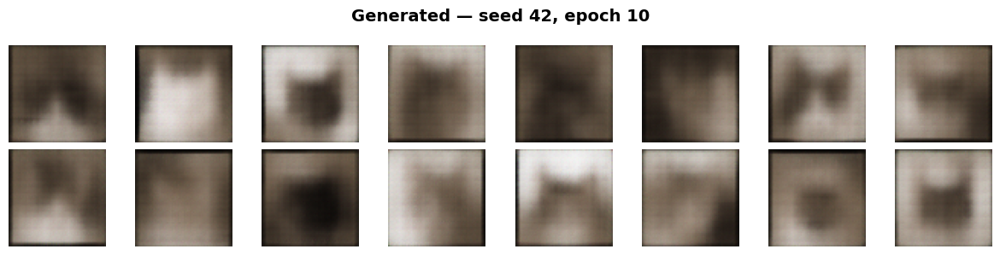

  [seed=42] Epoch [ 11/50] Loss: 0.1768 (recon=0.1377, kl=0.0390)
  [seed=42] Epoch [ 12/50] Loss: 0.1748 (recon=0.1357, kl=0.0390)
  [seed=42] Epoch [ 13/50] Loss: 0.1745 (recon=0.1352, kl=0.0393)
  [seed=42] Epoch [ 14/50] Loss: 0.1728 (recon=0.1332, kl=0.0396)
  [seed=42] Epoch [ 15/50] Loss: 0.1721 (recon=0.1323, kl=0.0397)
  [seed=42] Epoch [ 16/50] Loss: 0.1716 (recon=0.1316, kl=0.0399)
  [seed=42] Epoch [ 17/50] Loss: 0.1719 (recon=0.1318, kl=0.0401)
  [seed=42] Epoch [ 18/50] Loss: 0.1711 (recon=0.1310, kl=0.0401)
  [seed=42] Epoch [ 19/50] Loss: 0.1704 (recon=0.1306, kl=0.0398)
  [seed=42] Epoch [ 20/50] Loss: 0.1706 (recon=0.1304, kl=0.0402)


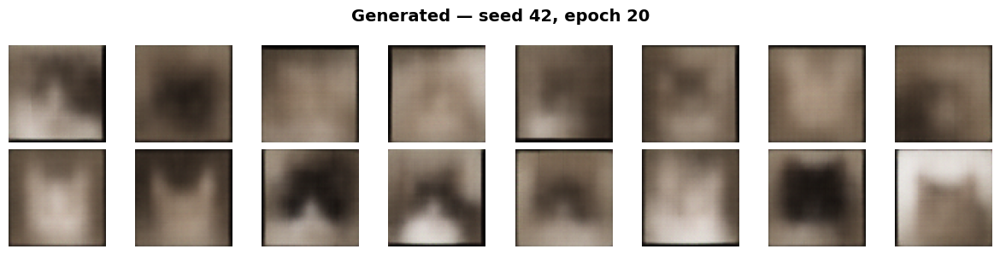

  [seed=42] Epoch [ 21/50] Loss: 0.1703 (recon=0.1301, kl=0.0401)
  [seed=42] Epoch [ 22/50] Loss: 0.1700 (recon=0.1297, kl=0.0403)
  [seed=42] Epoch [ 23/50] Loss: 0.1692 (recon=0.1289, kl=0.0404)
  [seed=42] Epoch [ 24/50] Loss: 0.1692 (recon=0.1289, kl=0.0403)
  [seed=42] Epoch [ 25/50] Loss: 0.1688 (recon=0.1284, kl=0.0404)
  [seed=42] Epoch [ 26/50] Loss: 0.1690 (recon=0.1286, kl=0.0404)
  [seed=42] Epoch [ 27/50] Loss: 0.1687 (recon=0.1281, kl=0.0407)
  [seed=42] Epoch [ 28/50] Loss: 0.1682 (recon=0.1268, kl=0.0414)
  [seed=42] Epoch [ 29/50] Loss: 0.1675 (recon=0.1259, kl=0.0416)
  [seed=42] Epoch [ 30/50] Loss: 0.1676 (recon=0.1257, kl=0.0418)


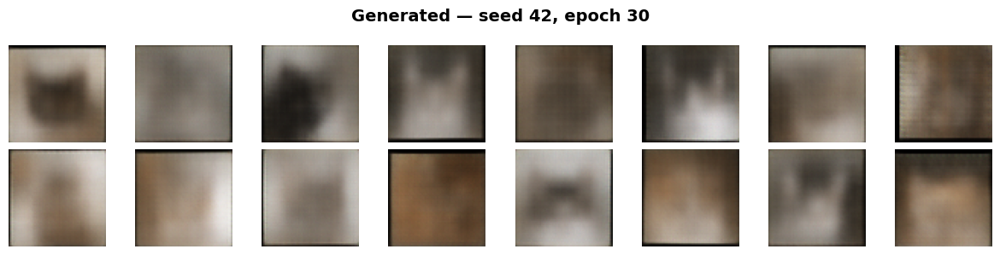

  [seed=42] Epoch [ 31/50] Loss: 0.1674 (recon=0.1255, kl=0.0419)
  [seed=42] Epoch [ 32/50] Loss: 0.1670 (recon=0.1252, kl=0.0418)
  [seed=42] Epoch [ 33/50] Loss: 0.1664 (recon=0.1245, kl=0.0419)
  [seed=42] Epoch [ 34/50] Loss: 0.1672 (recon=0.1250, kl=0.0422)
  [seed=42] Epoch [ 35/50] Loss: 0.1663 (recon=0.1241, kl=0.0422)
  [seed=42] Epoch [ 36/50] Loss: 0.1661 (recon=0.1240, kl=0.0421)
  [seed=42] Epoch [ 37/50] Loss: 0.1660 (recon=0.1238, kl=0.0422)
  [seed=42] Epoch [ 38/50] Loss: 0.1657 (recon=0.1236, kl=0.0420)
  [seed=42] Epoch [ 39/50] Loss: 0.1662 (recon=0.1238, kl=0.0423)
  [seed=42] Epoch [ 40/50] Loss: 0.1659 (recon=0.1238, kl=0.0421)


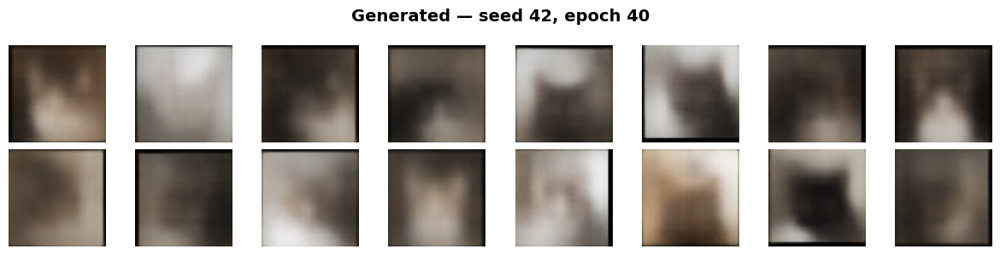

  [seed=42] Epoch [ 41/50] Loss: 0.1660 (recon=0.1235, kl=0.0425)
  [seed=42] Epoch [ 42/50] Loss: 0.1659 (recon=0.1236, kl=0.0423)
  [seed=42] Epoch [ 43/50] Loss: 0.1661 (recon=0.1235, kl=0.0426)
  [seed=42] Epoch [ 44/50] Loss: 0.1657 (recon=0.1233, kl=0.0424)
  [seed=42] Epoch [ 45/50] Loss: 0.1641 (recon=0.1216, kl=0.0425)
  [seed=42] Epoch [ 46/50] Loss: 0.1640 (recon=0.1214, kl=0.0426)
  [seed=42] Epoch [ 47/50] Loss: 0.1640 (recon=0.1214, kl=0.0427)
  [seed=42] Epoch [ 48/50] Loss: 0.1639 (recon=0.1211, kl=0.0428)
  [seed=42] Epoch [ 49/50] Loss: 0.1636 (recon=0.1208, kl=0.0428)
  [seed=42] Epoch [ 50/50] Loss: 0.1638 (recon=0.1208, kl=0.0430)


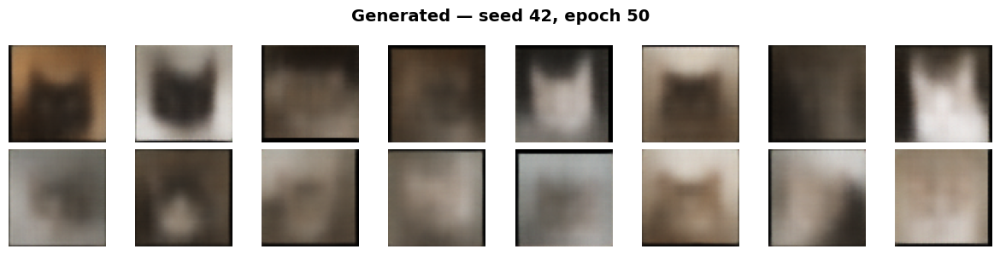

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.83it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 268.99  (lower is better)
Inception Score: 1.41 +/- 0.03  (higher is better)

-------------------------------------------------------
Training latent_dim=256 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.2770 (recon=0.2315, kl=0.0455)
  [seed=123] Epoch [  2/50] Loss: 0.2236 (recon=0.1830, kl=0.0405)
  [seed=123] Epoch [  3/50] Loss: 0.2029 (recon=0.1654, kl=0.0375)
  [seed=123] Epoch [  4/50] Loss: 0.1946 (recon=0.1564, kl=0.0382)
  [seed=123] Epoch [  5/50] Loss: 0.1881 (recon=0.1497, kl=0.0383)
  [seed=123] Epoch [  6/50] Loss: 0.1852 (recon=0.1465, kl=0.0386)
  [seed=123] Epoch [  7/50] Loss: 0.1834 (recon=0.1445, kl=0.0389)
  [seed=123] Epoch [  8/50] Loss: 0.1820 (recon=0.1431, kl=0.0389)
  [seed=123] Epoch [  9/50] Loss: 0.1804 (recon=0.1417, kl=0.0387)
  [seed=123] Epoch [ 10/50] Loss: 0.1802 (recon=0.1413, kl=0.0389)


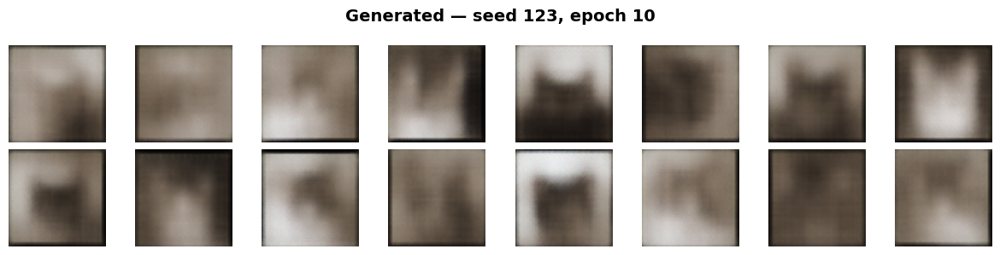

  [seed=123] Epoch [ 11/50] Loss: 0.1795 (recon=0.1406, kl=0.0389)
  [seed=123] Epoch [ 12/50] Loss: 0.1783 (recon=0.1394, kl=0.0390)
  [seed=123] Epoch [ 13/50] Loss: 0.1776 (recon=0.1383, kl=0.0393)
  [seed=123] Epoch [ 14/50] Loss: 0.1751 (recon=0.1357, kl=0.0394)
  [seed=123] Epoch [ 15/50] Loss: 0.1750 (recon=0.1354, kl=0.0395)
  [seed=123] Epoch [ 16/50] Loss: 0.1744 (recon=0.1348, kl=0.0396)
  [seed=123] Epoch [ 17/50] Loss: 0.1735 (recon=0.1336, kl=0.0399)
  [seed=123] Epoch [ 18/50] Loss: 0.1728 (recon=0.1331, kl=0.0397)
  [seed=123] Epoch [ 19/50] Loss: 0.1720 (recon=0.1321, kl=0.0399)
  [seed=123] Epoch [ 20/50] Loss: 0.1711 (recon=0.1311, kl=0.0400)


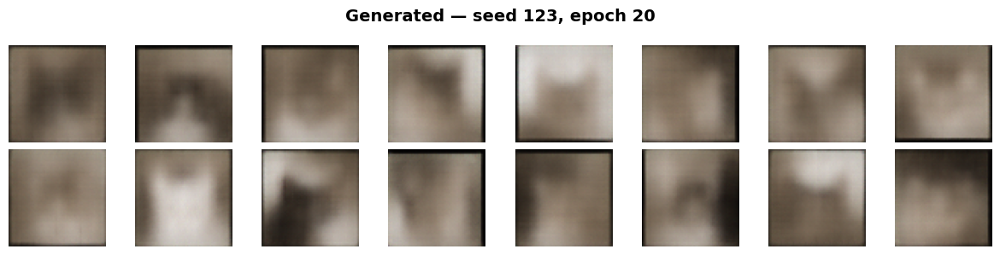

  [seed=123] Epoch [ 21/50] Loss: 0.1712 (recon=0.1312, kl=0.0401)
  [seed=123] Epoch [ 22/50] Loss: 0.1707 (recon=0.1305, kl=0.0401)
  [seed=123] Epoch [ 23/50] Loss: 0.1702 (recon=0.1299, kl=0.0403)
  [seed=123] Epoch [ 24/50] Loss: 0.1700 (recon=0.1299, kl=0.0401)
  [seed=123] Epoch [ 25/50] Loss: 0.1699 (recon=0.1296, kl=0.0402)
  [seed=123] Epoch [ 26/50] Loss: 0.1694 (recon=0.1292, kl=0.0403)
  [seed=123] Epoch [ 27/50] Loss: 0.1689 (recon=0.1287, kl=0.0402)
  [seed=123] Epoch [ 28/50] Loss: 0.1690 (recon=0.1286, kl=0.0403)
  [seed=123] Epoch [ 29/50] Loss: 0.1689 (recon=0.1286, kl=0.0403)
  [seed=123] Epoch [ 30/50] Loss: 0.1689 (recon=0.1283, kl=0.0406)


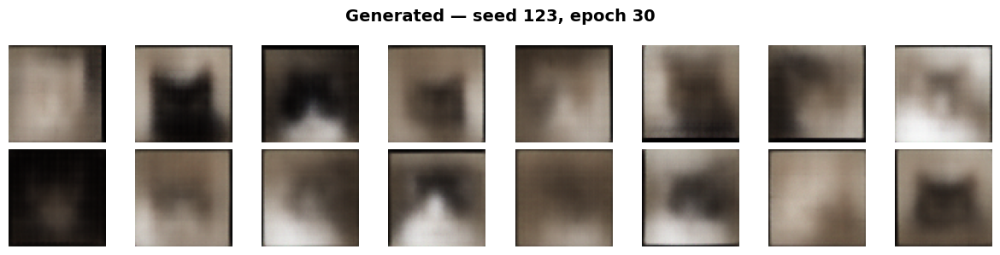

  [seed=123] Epoch [ 31/50] Loss: 0.1684 (recon=0.1278, kl=0.0405)
  [seed=123] Epoch [ 32/50] Loss: 0.1686 (recon=0.1278, kl=0.0407)
  [seed=123] Epoch [ 33/50] Loss: 0.1680 (recon=0.1272, kl=0.0408)
  [seed=123] Epoch [ 34/50] Loss: 0.1676 (recon=0.1260, kl=0.0416)
  [seed=123] Epoch [ 35/50] Loss: 0.1673 (recon=0.1251, kl=0.0421)
  [seed=123] Epoch [ 36/50] Loss: 0.1673 (recon=0.1249, kl=0.0423)
  [seed=123] Epoch [ 37/50] Loss: 0.1668 (recon=0.1243, kl=0.0425)
  [seed=123] Epoch [ 38/50] Loss: 0.1665 (recon=0.1242, kl=0.0423)
  [seed=123] Epoch [ 39/50] Loss: 0.1666 (recon=0.1240, kl=0.0425)
  [seed=123] Epoch [ 40/50] Loss: 0.1663 (recon=0.1237, kl=0.0426)


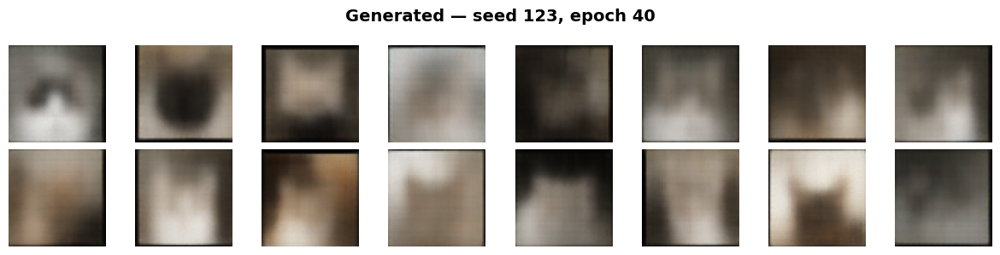

  [seed=123] Epoch [ 41/50] Loss: 0.1659 (recon=0.1232, kl=0.0427)
  [seed=123] Epoch [ 42/50] Loss: 0.1661 (recon=0.1235, kl=0.0426)
  [seed=123] Epoch [ 43/50] Loss: 0.1658 (recon=0.1230, kl=0.0428)
  [seed=123] Epoch [ 44/50] Loss: 0.1663 (recon=0.1232, kl=0.0431)
  [seed=123] Epoch [ 45/50] Loss: 0.1656 (recon=0.1229, kl=0.0427)
  [seed=123] Epoch [ 46/50] Loss: 0.1659 (recon=0.1231, kl=0.0428)
  [seed=123] Epoch [ 47/50] Loss: 0.1655 (recon=0.1225, kl=0.0430)
  [seed=123] Epoch [ 48/50] Loss: 0.1657 (recon=0.1229, kl=0.0429)
  [seed=123] Epoch [ 49/50] Loss: 0.1655 (recon=0.1225, kl=0.0431)
  [seed=123] Epoch [ 50/50] Loss: 0.1654 (recon=0.1225, kl=0.0429)


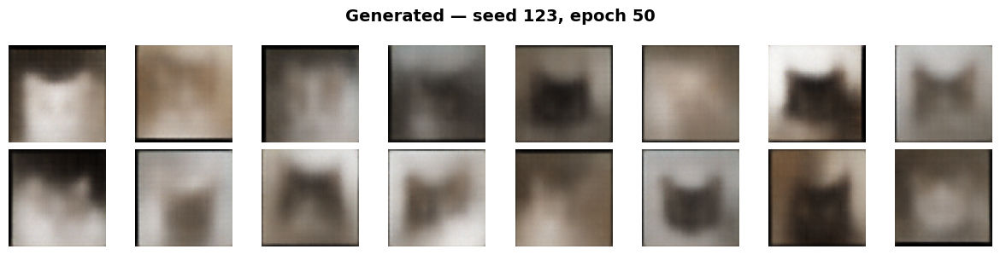

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.87it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 260.59  (lower is better)
Inception Score: 1.36 +/- 0.03  (higher is better)

-------------------------------------------------------
Training latent_dim=256 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.2846 (recon=0.2389, kl=0.0457)
  [seed=456] Epoch [  2/50] Loss: 0.2247 (recon=0.1849, kl=0.0398)
  [seed=456] Epoch [  3/50] Loss: 0.2114 (recon=0.1717, kl=0.0396)
  [seed=456] Epoch [  4/50] Loss: 0.1960 (recon=0.1583, kl=0.0377)
  [seed=456] Epoch [  5/50] Loss: 0.1886 (recon=0.1507, kl=0.0379)
  [seed=456] Epoch [  6/50] Loss: 0.1848 (recon=0.1470, kl=0.0378)
  [seed=456] Epoch [  7/50] Loss: 0.1839 (recon=0.1455, kl=0.0384)
  [seed=456] Epoch [  8/50] Loss: 0.1816 (recon=0.1430, kl=0.0386)
  [seed=456] Epoch [  9/50] Loss: 0.1805 (recon=0.1421, kl=0.0385)
  [seed=456] Epoch [ 10/50] Loss: 0.1794 (recon=0.1410, kl=0.0384)


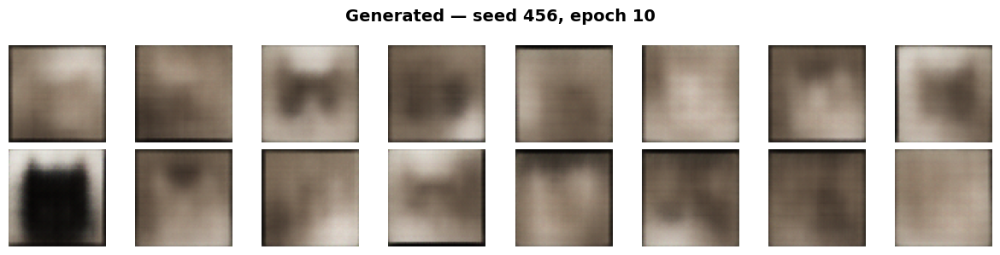

  [seed=456] Epoch [ 11/50] Loss: 0.1794 (recon=0.1407, kl=0.0386)
  [seed=456] Epoch [ 12/50] Loss: 0.1783 (recon=0.1397, kl=0.0386)
  [seed=456] Epoch [ 13/50] Loss: 0.1771 (recon=0.1386, kl=0.0385)
  [seed=456] Epoch [ 14/50] Loss: 0.1767 (recon=0.1379, kl=0.0389)
  [seed=456] Epoch [ 15/50] Loss: 0.1750 (recon=0.1363, kl=0.0387)
  [seed=456] Epoch [ 16/50] Loss: 0.1747 (recon=0.1356, kl=0.0392)
  [seed=456] Epoch [ 17/50] Loss: 0.1736 (recon=0.1344, kl=0.0393)
  [seed=456] Epoch [ 18/50] Loss: 0.1729 (recon=0.1339, kl=0.0390)
  [seed=456] Epoch [ 19/50] Loss: 0.1728 (recon=0.1334, kl=0.0394)
  [seed=456] Epoch [ 20/50] Loss: 0.1721 (recon=0.1327, kl=0.0394)


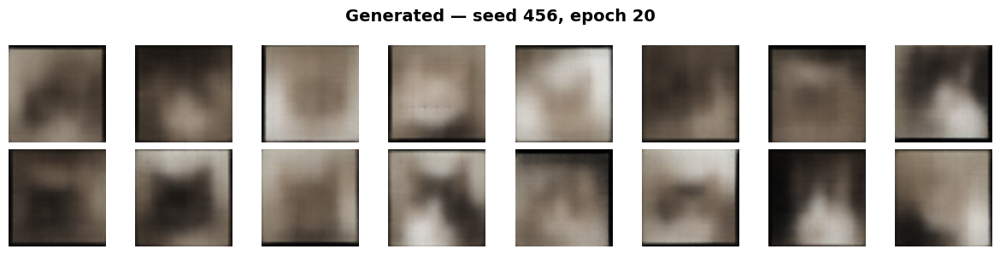

  [seed=456] Epoch [ 21/50] Loss: 0.1715 (recon=0.1319, kl=0.0396)
  [seed=456] Epoch [ 22/50] Loss: 0.1713 (recon=0.1316, kl=0.0397)
  [seed=456] Epoch [ 23/50] Loss: 0.1699 (recon=0.1299, kl=0.0400)
  [seed=456] Epoch [ 24/50] Loss: 0.1698 (recon=0.1298, kl=0.0400)
  [seed=456] Epoch [ 25/50] Loss: 0.1696 (recon=0.1292, kl=0.0404)
  [seed=456] Epoch [ 26/50] Loss: 0.1689 (recon=0.1286, kl=0.0403)
  [seed=456] Epoch [ 27/50] Loss: 0.1685 (recon=0.1281, kl=0.0404)
  [seed=456] Epoch [ 28/50] Loss: 0.1687 (recon=0.1279, kl=0.0408)
  [seed=456] Epoch [ 29/50] Loss: 0.1682 (recon=0.1272, kl=0.0409)
  [seed=456] Epoch [ 30/50] Loss: 0.1681 (recon=0.1273, kl=0.0409)


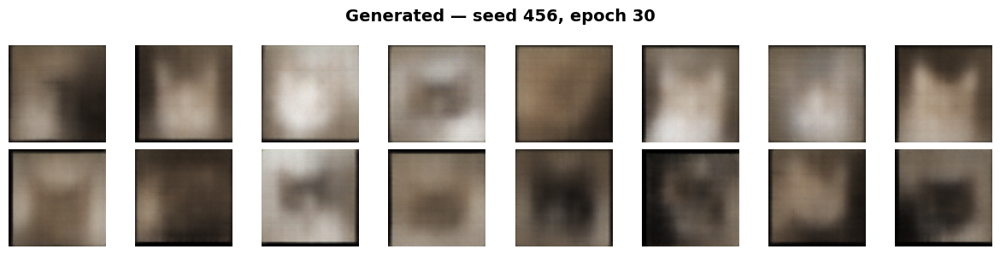

  [seed=456] Epoch [ 31/50] Loss: 0.1679 (recon=0.1264, kl=0.0415)
  [seed=456] Epoch [ 32/50] Loss: 0.1674 (recon=0.1253, kl=0.0421)
  [seed=456] Epoch [ 33/50] Loss: 0.1663 (recon=0.1242, kl=0.0421)
  [seed=456] Epoch [ 34/50] Loss: 0.1665 (recon=0.1240, kl=0.0425)
  [seed=456] Epoch [ 35/50] Loss: 0.1662 (recon=0.1238, kl=0.0424)
  [seed=456] Epoch [ 36/50] Loss: 0.1663 (recon=0.1236, kl=0.0427)
  [seed=456] Epoch [ 37/50] Loss: 0.1660 (recon=0.1234, kl=0.0425)
  [seed=456] Epoch [ 38/50] Loss: 0.1660 (recon=0.1232, kl=0.0428)
  [seed=456] Epoch [ 39/50] Loss: 0.1659 (recon=0.1231, kl=0.0429)
  [seed=456] Epoch [ 40/50] Loss: 0.1656 (recon=0.1227, kl=0.0428)


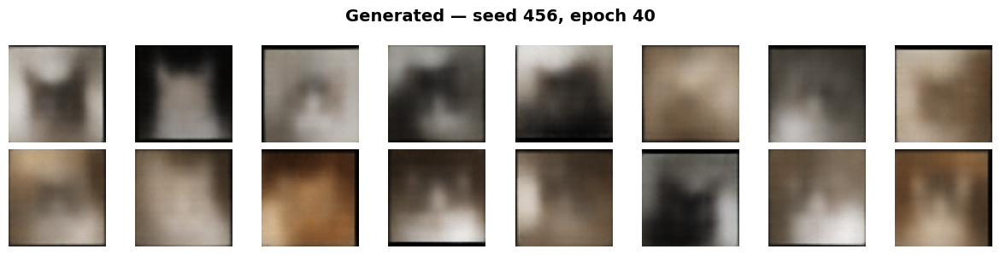

  [seed=456] Epoch [ 41/50] Loss: 0.1659 (recon=0.1232, kl=0.0427)
  [seed=456] Epoch [ 42/50] Loss: 0.1654 (recon=0.1226, kl=0.0428)
  [seed=456] Epoch [ 43/50] Loss: 0.1657 (recon=0.1229, kl=0.0427)
  [seed=456] Epoch [ 44/50] Loss: 0.1652 (recon=0.1223, kl=0.0429)
  [seed=456] Epoch [ 45/50] Loss: 0.1648 (recon=0.1219, kl=0.0429)
  [seed=456] Epoch [ 46/50] Loss: 0.1648 (recon=0.1218, kl=0.0430)
  [seed=456] Epoch [ 47/50] Loss: 0.1652 (recon=0.1222, kl=0.0429)
  [seed=456] Epoch [ 48/50] Loss: 0.1646 (recon=0.1216, kl=0.0429)
  [seed=456] Epoch [ 49/50] Loss: 0.1649 (recon=0.1218, kl=0.0431)
  [seed=456] Epoch [ 50/50] Loss: 0.1646 (recon=0.1215, kl=0.0431)


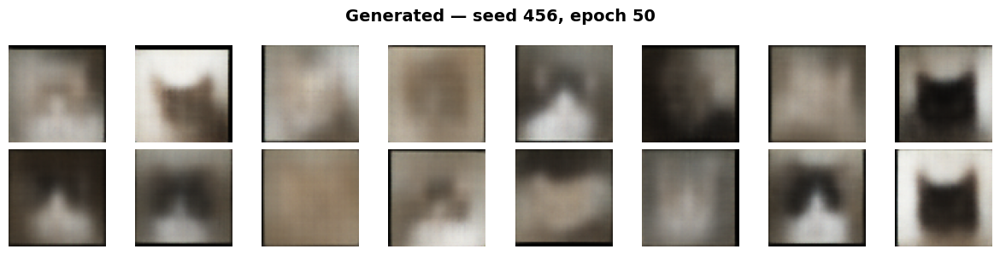

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:01<00:12, 11.51it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 263.42  (lower is better)
Inception Score: 1.41 +/- 0.03  (higher is better)


In [13]:
latent_results, latent_models = experiment_train_latent_dim(config=CONFIG)

In [ ]:
plot_hyperparam_comparison(
    results_dict={
        f"latdim={latdim}": list(seed_results.values())
        for latdim, seed_results in latent_results.items()
    },
    param_name="latent dimension",
    title="VAE Latent Dimension Comparison",
    save_path=f"{CONFIG['checkpoint_dir']}/vae_latdim_comparison.png"
)

latent_results.keys()

In [ ]:
print("aa")